In [2]:
# import libraries
import cv2
import numpy as np
import glob
from matplotlib import pyplot as plt 
import math
import random

# store images in imgs1[] and imgs2[] in grayscale mode
data_path1 = 'sample_images/*'
img_files1 = glob.glob(data_path1)
imgs1 = []
for file in img_files1:
    img = cv2.imread(file)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    imgs1.append(img)

data_path2 = 'sample_images2/*'
img_files2 = glob.glob(data_path2)
imgs2 = []
for file in img_files2:
    img = cv2.imread(file)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) 
    imgs2.append(img)
    
# zero paddinh function
def zero_padding(img, kernel_size=3):
    return np.pad(img, kernel_size//2, mode='constant')

# convolution functoin
def convolution(img, kernel, average=False):
    
    kernel_size = kernel.shape[0]
    pad_size = int(kernel_size / 2)
    img_rows, img_cols = img.shape
    
    
    # padding images with zeros
    padded_img = zero_padding(img, kernel_size)
    
    # store padded img rows and cols size     
    padded_img_rows, padded_img_cols = padded_img.shape
    
    # create the new image    
    new_img = np.empty((padded_img_rows-2*pad_size, padded_img_cols-2*pad_size))
    
    # apply krnel to each pixel of image
    for r in range(padded_img_rows-2*pad_size):
        for c in range(padded_img_cols-2*pad_size):
            new_img[r, c] = np.sum(kernel * padded_img[r:r+kernel_size, c:c+kernel_size])
            
            # if average parameter is true, devide img pixels by the kernel size (rows*cols) 
            if(average):
                new_img[r, c] /= kernel_size * kernel_size
                
            # don't allow values less than 0 or more than 255             
            if(new_img[r, c] > 255):
                new_img[r, c] = 255
            elif(new_img[r, c] < 0):
                new_img[r, c] = 0
                
    # return result 
    return new_img
        
# show filtered images function 
def showFilteredImages(images, kernel, filter_name, average=False):        
    for img in images:
        # orginal image 
        plt.subplot(1, 2, 1), plt.imshow(img, 'gray')
        plt.title('Orginal Image')
        # filtered image  
        plt.subplot(1, 2, 2), plt.imshow(convolution(img, kernel, average), 'gray')
        plt.title('Filtered with ' + filter_name)
        plt.show()
        

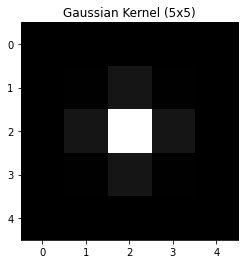

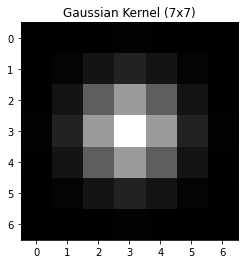

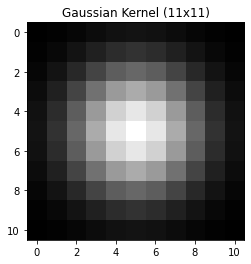

In [3]:
# Question 1:

# define Gaussian formula
def gaussian_filter_formula(x, mean, sigma):
    return (1 / (math.sqrt(2 * math.pi) * sigma) ) * math.exp( -math.pow((x - mean), 2) / (2 * math.pow(sigma, 2)) )
 
# build gaussian kernel
def gaussian_kernel(kernel_size, sigma):
    # create 1D vector with '1 step size'
    kernel_1D = np.linspace(-(kernel_size // 2), kernel_size // 2, kernel_size)
    
    # apply gaussian formula to each element 
    for i in range(kernel_size):
        x = kernel_1D[i]
        kernel_1D[i] = gaussian_filter_formula(x, 0, sigma)
    
    # build the 2D kernel using the 1D vector elements
    kernel_2D = np.outer(kernel_1D, kernel_1D)
    
    #do the normalization and set the center value to '1'
    kernel_2D = kernel_2D  / kernel_2D.max()
    
    plt.imshow(kernel_2D, interpolation='none', cmap='gray')
    plt.title("Gaussian Kernel ({}x{})".format(kernel_size, kernel_size))
    plt.show()
    return kernel_2D

# build kernels with different sigma and size values, then show filtered images from sample_images1
gaussian_kernel5 = gaussian_kernel(5, math.sqrt(0.2))
showFilteredImages(imgs1, gaussian_kernel5, 'Gaussian Kernel (5x5)', True)

gaussian_kernel7 = gaussian_kernel(7, math.sqrt(1.0))
showFilteredImages(imgs1, gaussian_kernel7, 'Gaussian Kernel (7x7)', True)

gaussian_kernel11 = gaussian_kernel(11, math.sqrt(5.0))
showFilteredImages(imgs1, gaussian_kernel11, 'Gaussian Kernel (11x11)', True)

In [4]:
# Question 2: Use 3x3, 5x5, 7x7 Gaussian kernels given below. You will do normalization on filters
# dividing by the sum of coefficient. [2] Implement each kernel to the each given image in
# ‘sample images1’ directory in the zip file.

# show filtered images function 
def showFilteredImages(images, kernel, filter_name, average=False):        
    for img in images:
        fig, (ax1) = plt.subplots(1, 2, figsize=(10, 10))
        # orginal image 
        ax1[0].set_title('Orginal Image')
        ax1[0].imshow(img, 'gray')
        # filtered image  
        ax1[1].set_title('Filtered with ' + filter_name)
        filtered_img = convolution(img, kernel)
        ax1[1].imshow(filtered_img, 'gray')
        plt.show()
        
# (3*3) Gaussian Kernel
gaussian_kernel1 = np.array([[1,2,1],[2,4,2],[1,2,1]])
# Kernel Normalization
gaussian_kernel1 = gaussian_kernel1 * (1/gaussian_kernel1.sum())

# (5*5) Gaussian Kernel
gaussian_kernel2 = np.array([[1,1,2,1,1],[1,2,4,2,1],[2,4,8,4,2],[1,2,4,2,1],[1,1,2,1,1]])
# Kernel Normalization
gaussian_kernel2 = gaussian_kernel2 * (1/gaussian_kernel2.sum())

# (7*7) Gaussian Kernel
gaussian_kernel3 = np.array([[1,1,2,2,2,1,1],[1,2,2,4,2,2,1],[2,2,4,8,4,2,2],[2,4,8,16,8,4,2],[2,2,4,8,4,2,2],[1,2,2,4,2,2,1],[1,1,2,2,2,1,1]])
# Kernel Normalization
gaussian_kernel3 = gaussian_kernel3 * (1/gaussian_kernel3.sum())

print('Question 2: Filtered Images with given gaussian kernels')
showFilteredImages(imgs1, gaussian_kernel1, 'Gaussian Kernel (3x3)')
showFilteredImages(imgs1, gaussian_kernel2, 'Gaussian Kernel (5x5)')
showFilteredImages(imgs1, gaussian_kernel3, 'Gaussian Kernel (7x7)')


Question 2: Filtered Images with given gaussian kernels


Question 3: Sharpening images with given gaussian kernels


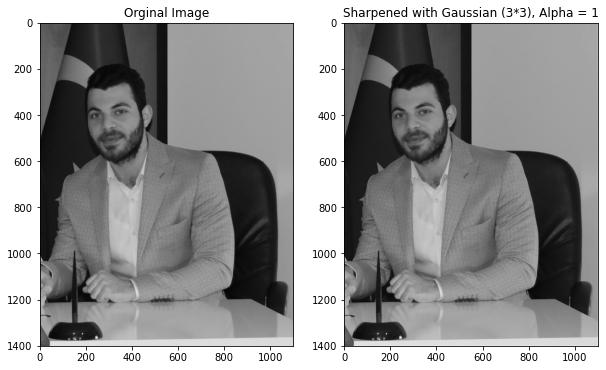

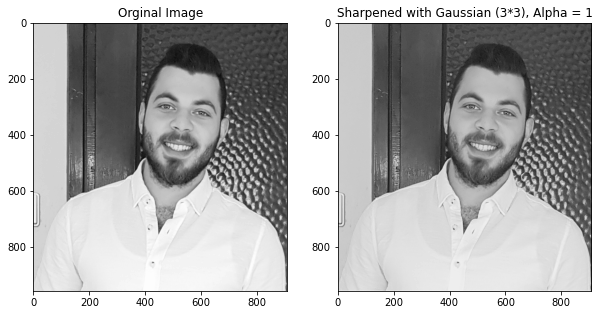

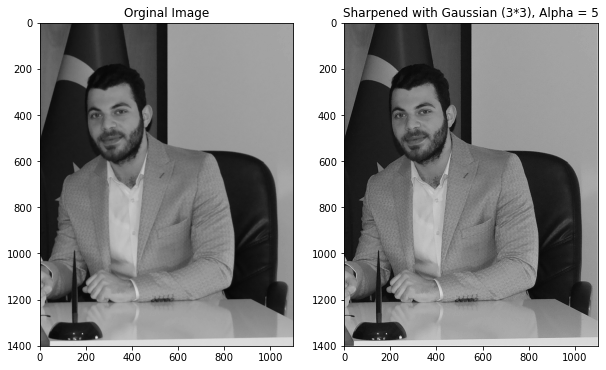

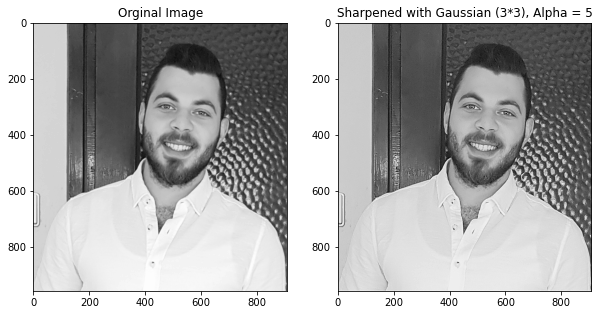

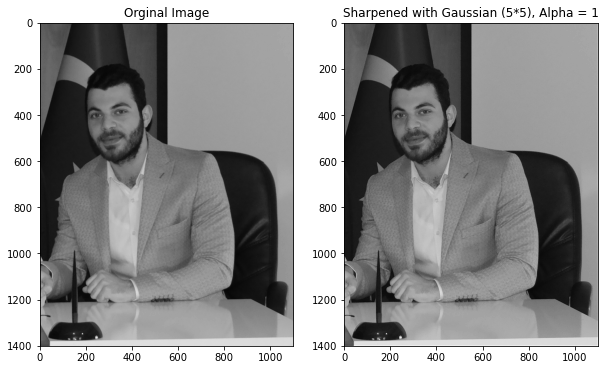

...

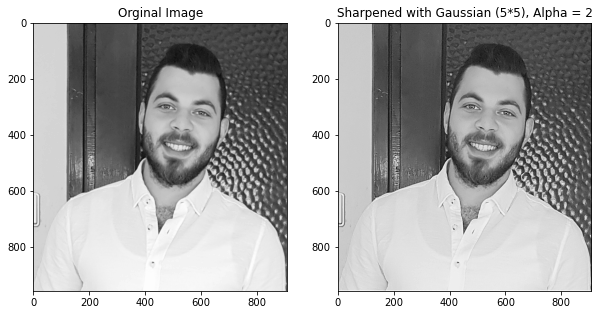

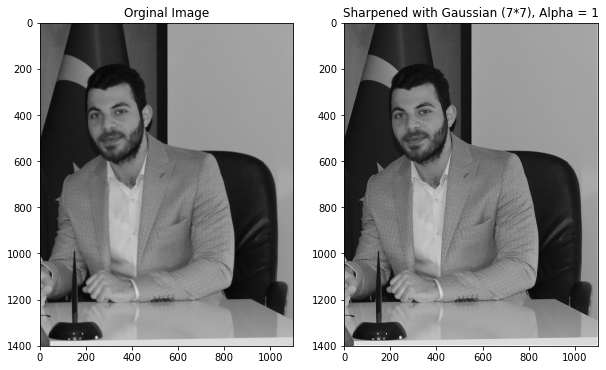

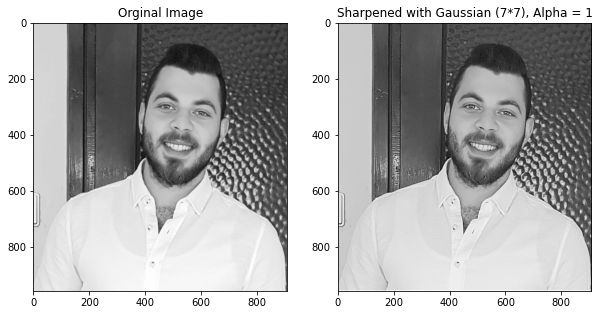

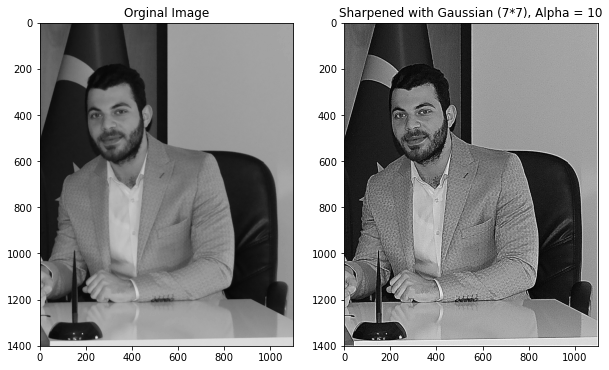

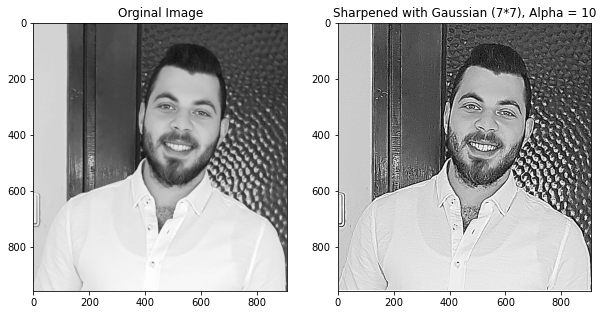

In [5]:

# Question 3: 
# Use Gaussian kernels given in question#2 as sharpening filter. According to lecture
# slides, F = F + a( F - (F * H))
# H will be Gaussian Kernel. Use different α values. Implement each filter to your own face
# image.

# store images in my_images[]
data_path = 'my_images/*'
img_files = glob.glob(data_path)
my_images = []
for file in img_files:
    img = cv2.imread(file)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    my_images.append(img)

def sharpening_with_gaussian(img, kernel, alpha):
    
    img_rows, img_cols = img.shape
    
    output_image = np.empty((img_rows, img_cols))
    
    blured_img = convolution(img, kernel)
    img_detail = (img - blured_img)
    
    for r in range(img_rows):
        for c in range(img_cols):
            
            output_image[r, c] = img[r, c] + (alpha * (img_detail[r, c]))
                            
            # don't allow values less than 0 or more than 255             
            if(output_image[r, c] > 255):
                output_image[r, c] = 255
            elif(output_image[r, c] < 0):
                output_image[r, c] = 0
                
    
    return output_image

def showSharpenedImages(input_images, kernel, alpha, filter_details):
    for img in input_images:
        fig, (ax1) = plt.subplots(1, 2, figsize=(10, 10))
        # orginal image 
        ax1[0].set_title('Orginal Image')
        ax1[0].imshow(img, 'gray')
        # filtered image  
        ax1[1].set_title('Sharpened with ' + filter_details)
        output_image = sharpening_with_gaussian(img, kernel, alpha)
        ax1[1].imshow(output_image, 'gray')
        plt.show()

    
print('Question 3: Sharpening images with given gaussian kernels')


        
showSharpenedImages(my_images, gaussian_kernel1, 1, 'Gaussian (3*3), Alpha = 1')
showSharpenedImages(my_images, gaussian_kernel1, 5, 'Gaussian (3*3), Alpha = 5')

showSharpenedImages(my_images, gaussian_kernel2, 1, 'Gaussian (5*5), Alpha = 1')
showSharpenedImages(my_images, gaussian_kernel2, 2, 'Gaussian (5*5), Alpha = 2')

showSharpenedImages(my_images, gaussian_kernel3, 1, 'Gaussian (7*7), Alpha = 1')
showSharpenedImages(my_images, gaussian_kernel3, 10, 'Gaussian (7*7), Alpha = 10')


Question 4: Filter images with Meadian Filter


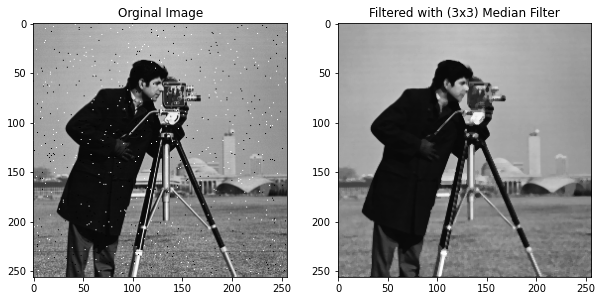

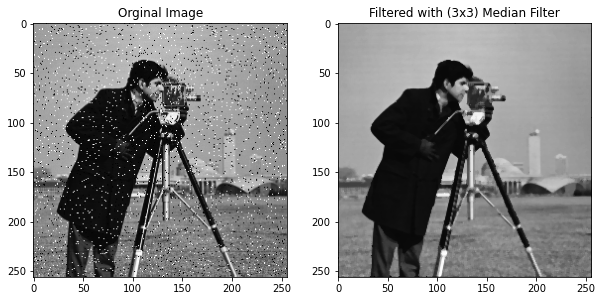

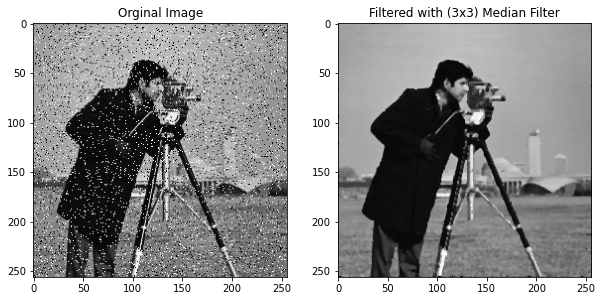

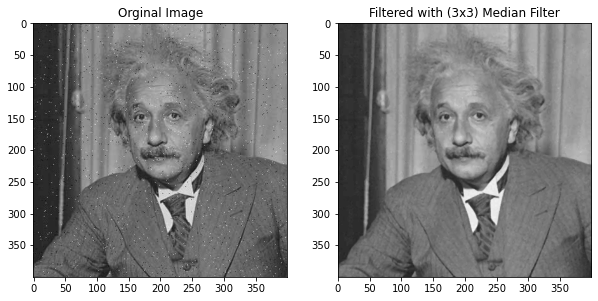

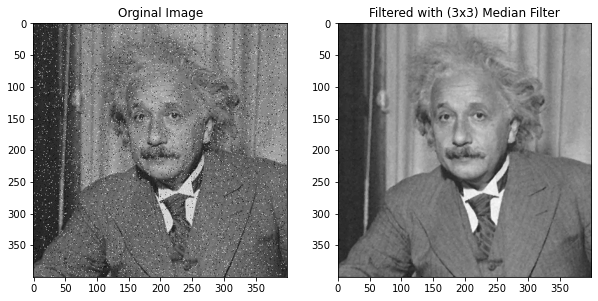

...

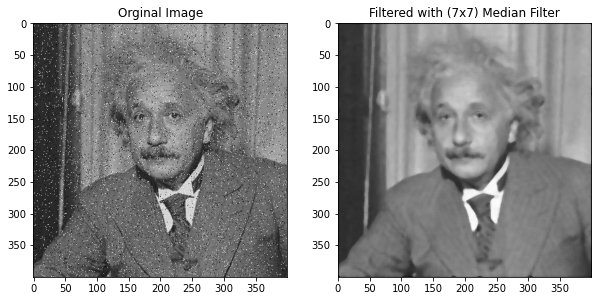

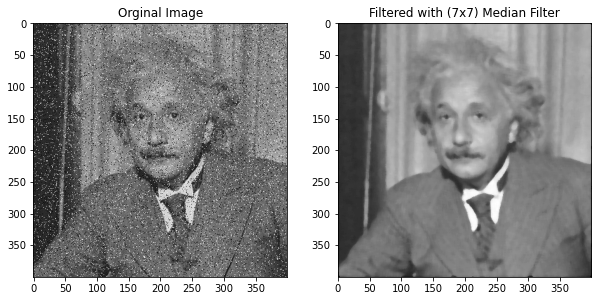

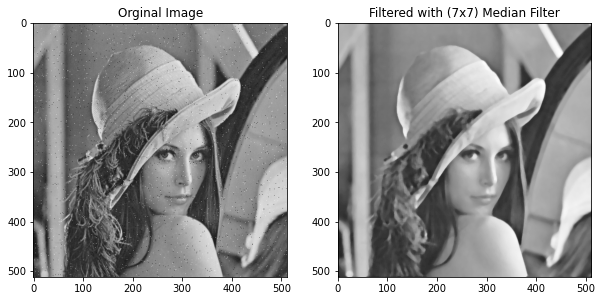

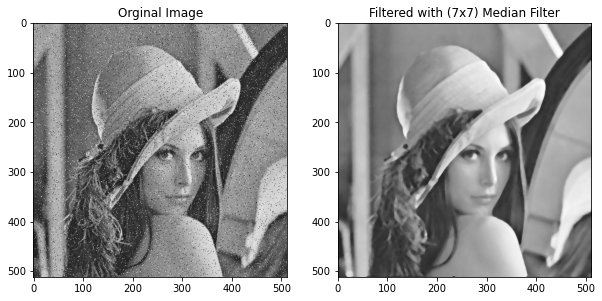

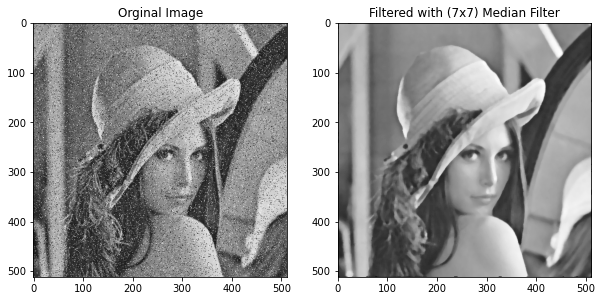

In [6]:
    
# Question 4: 

data_path2 = 'sample_images2/*'
img_files2 = glob.glob(data_path2)
imgs2 = []
for file in img_files2:
    img = cv2.imread(file)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    imgs2.append(img)
    
# sort function using insertion sort algorithm
def insertionSort(vector):
    for i in range(1, len(vector)):
        key = vector[i]
        j = i-1
        while(j >=0 and key < vector[j]):
            vector[j+1] = vector[j]
            j -= 1
        vector[j+1] = key

def medianFilter(img, kernel_size):
    
#     kernel_rows, kernel_cols = kernel.shape
    img_rows, img_cols = img.shape
    
    pad_size = int(kernel_size / 2)
    
    # padding images with zeros
    padded_img = zero_padding(img, kernel_size)
    
    padded_img_rows, padded_img_cols = padded_img.shape
    
    # create the new image
    new_img = np.empty((padded_img_rows-2*pad_size, padded_img_cols-2*pad_size))
    
    # apply krnel to each pixel of image
    for r in range(padded_img_rows-2*pad_size):
        for c in range(padded_img_cols-2*pad_size):
            # store iterated 2D image pixels to a 1D vector to sort them  
            vals = padded_img[r:r+kernel_size, c:c+kernel_size].flatten()
            # sort pixel values
            insertionSort(vals)
            # set the new image pixels to median values we sorted from the padded image
            new_img[r, c] = vals[int(len(vals)/2)]
            
    # return result           
    return new_img

def showFilteredImages(input_images, kernel_size):        
    for img in input_images:
        fig, (ax1) = plt.subplots(1, 2, figsize=(10, 10))
        # orginal image 
        ax1[0].set_title('Orginal Image')
        ax1[0].imshow(img, 'gray')
        # filtered image  
        ax1[1].set_title('Filtered with ({}x{}) Median Filter'.format(kernel_size, kernel_size))
        filtered_img = medianFilter(img, kernel_size)
        ax1[1].imshow(filtered_img, 'gray')
        plt.show()
    

print('Question 4: Filter images with Meadian Filter')
showFilteredImages(imgs2, 3)
showFilteredImages(imgs2, 5)
showFilteredImages(imgs2, 7)


Add salt and pepper noise in different intensity of noise: 


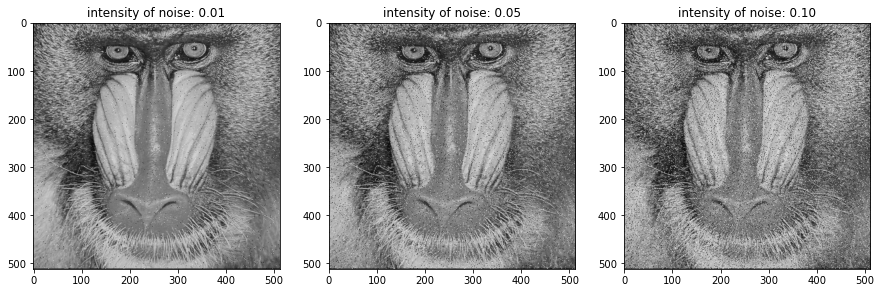

Apply (3x3) median filter for noised images: 


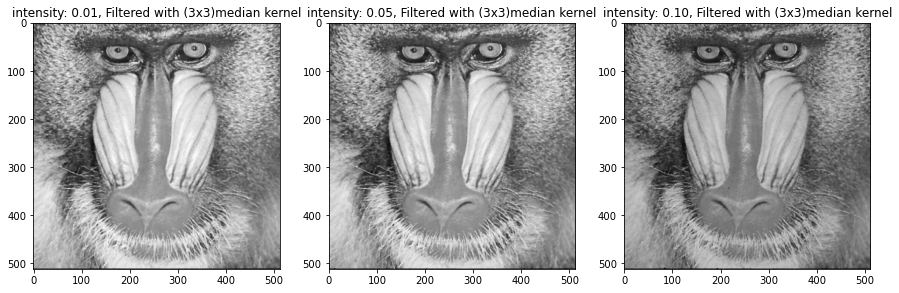

Apply (5*5) median filter for noised images: 


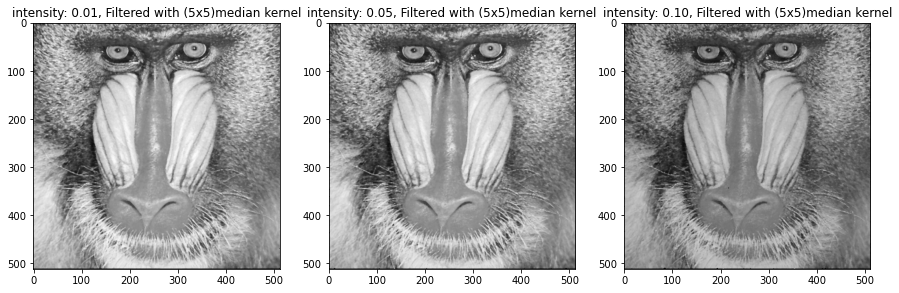

Apply (7*7) median filter for noised images: 


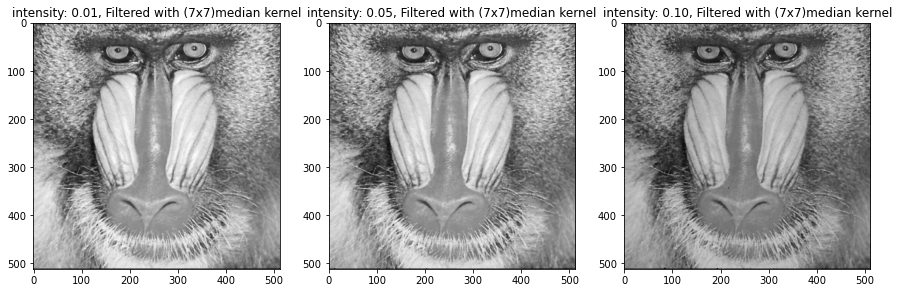

In [7]:
 
# Question 5: Take the Baboon image from 'sample images1' directory, and add salt and pepper noise. 
# Create three different outputs where intensity of the salt and pepper noise differ for each output. 
# Your outputs should be similar to the images in 'sample images2' directory. 
# Then apply 3x3, 5x5 and 7x7 median filters to the images that you have created.

# read Baboon image and convert it to grayscale
Baboon_img = cv2.imread('sample_images1/Baboon.bmp')
Baboon_img = cv2.cvtColor(Baboon_img, cv2.COLOR_BGR2GRAY)

# salt and pepper function
def salt_and_pepper(img, intensity):
    # input image 
    output_image = np.zeros(img.shape,np.uint8)
    
    # couonter pixels 
    #(i used this this variable just to add white and black noise)
    counter = 0
    
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            counter+=1
            
            # create random value
            rnd = random.random()
            
            # add salt and pepper noise randomly with specific intensity
            if intensity > rnd:
            # when counter is even, change pixel color to black
                if(counter%2==0):
                    output_image[i][j] = 0
            # when it is odd, change pixels calar to white
                elif (counter%2==1):
                    output_image[i][j] = 255
            else:
                output_image[i][j] = img[i][j]
                
    return output_image

print('Add salt and pepper noise in different intensity of noise: ')
Baboon1 = salt_and_pepper(Baboon_img, 0.01)
Baboon2 = salt_and_pepper(Baboon_img, 0.05)
Baboon3 = salt_and_pepper(Baboon_img, 0.1)


fig, (ax1) = plt.subplots(1, 3, figsize=(15, 15))
ax1[0].set_title('intensity of noise: 0.01')
ax1[0].imshow(Baboon1, 'gray')
ax1[1].set_title('intensity of noise: 0.05')
ax1[1].imshow(Baboon2, 'gray')
ax1[2].set_title('intensity of noise: 0.10')
ax1[2].imshow(Baboon3, 'gray')
plt.show()


print('Apply (3x3) median filter for noised images: ')
fig, (ax1) = plt.subplots(1, 3, figsize=(15, 15))
ax1[0].set_title('intensity: 0.01, Filtered with (3x3)median kernel')
ax1[0].imshow(medianFilter(Baboon1, 3), 'gray')
ax1[1].set_title('intensity: 0.05, Filtered with (3x3)median kernel')
ax1[1].imshow(medianFilter(Baboon2, 3), 'gray')
ax1[2].set_title('intensity: 0.10, Filtered with (3x3)median kernel')
ax1[2].imshow(medianFilter(Baboon3, 3), 'gray')
plt.show()


print('Apply (5*5) median filter for noised images: ')
fig, (ax1) = plt.subplots(1, 3, figsize=(15, 15))
ax1[0].set_title('intensity: 0.01, Filtered with (5x5)median kernel')
ax1[0].imshow(medianFilter(Baboon1, 3), 'gray')
ax1[1].set_title('intensity: 0.05, Filtered with (5x5)median kernel')
ax1[1].imshow(medianFilter(Baboon2, 3), 'gray')
ax1[2].set_title('intensity: 0.10, Filtered with (5x5)median kernel')
ax1[2].imshow(medianFilter(Baboon3, 3), 'gray')
plt.show()

print('Apply (7*7) median filter for noised images: ')
fig, (ax1) = plt.subplots(1, 3, figsize=(15, 15))
ax1[0].set_title('intensity: 0.01, Filtered with (7x7)median kernel')
ax1[0].imshow(medianFilter(Baboon1, 3), 'gray')
ax1[1].set_title('intensity: 0.05, Filtered with (7x7)median kernel')
ax1[1].imshow(medianFilter(Baboon2, 3), 'gray')
ax1[2].set_title('intensity: 0.10, Filtered with (7x7)median kernel')
ax1[2].imshow(medianFilter(Baboon3, 3), 'gray')
plt.show()


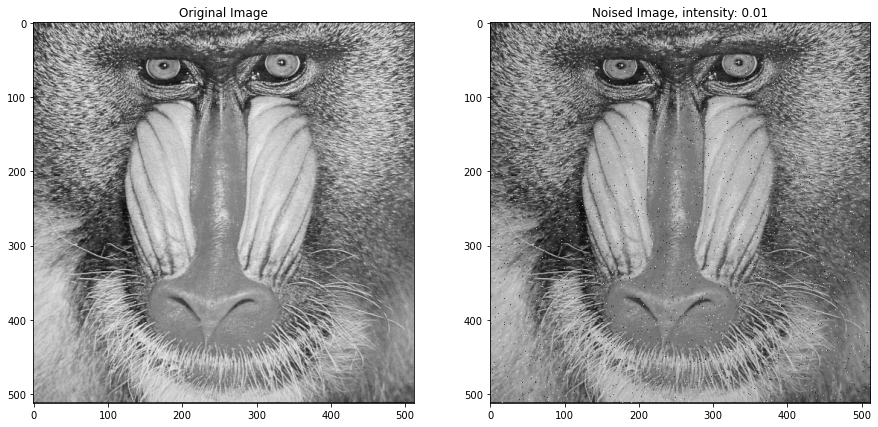

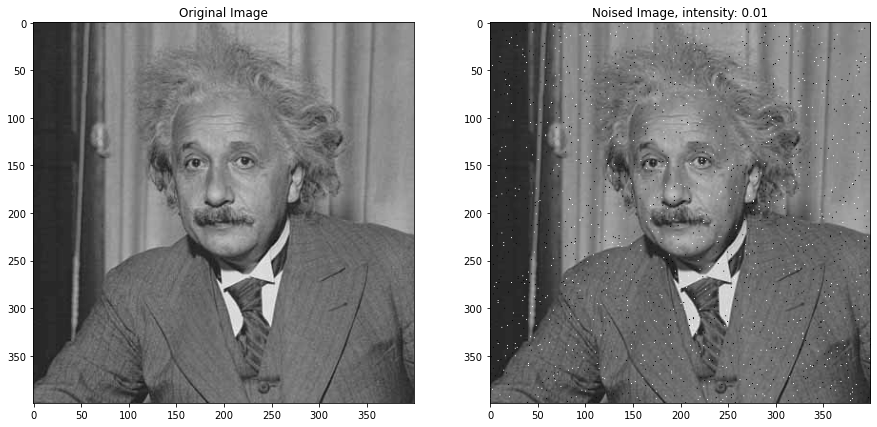

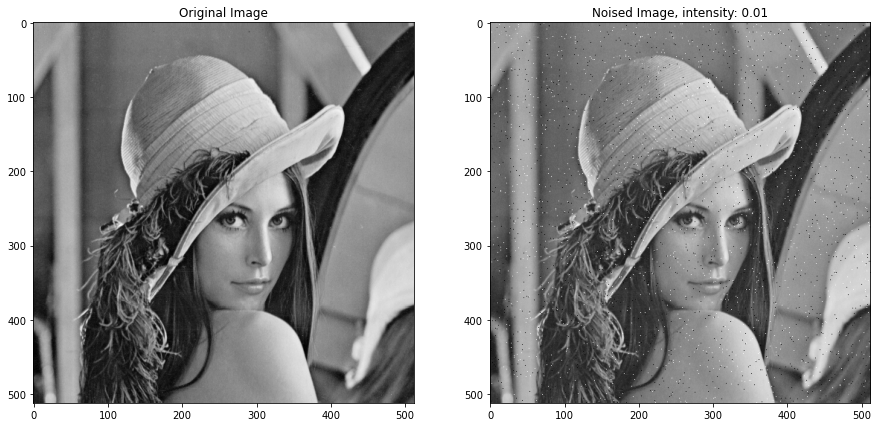

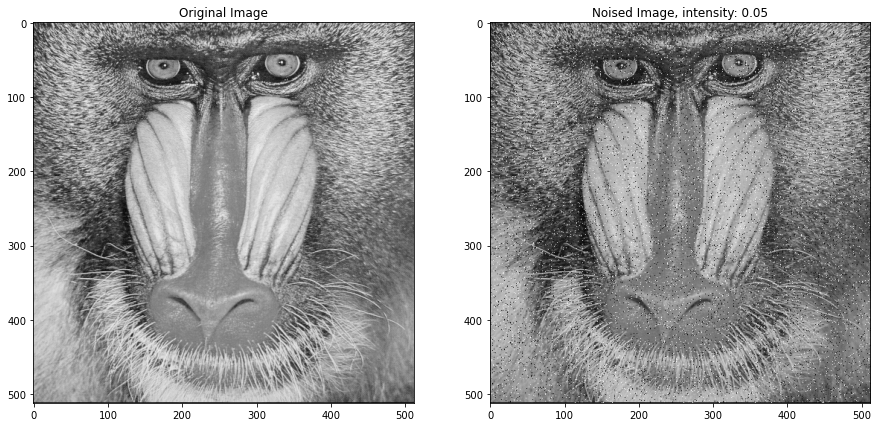

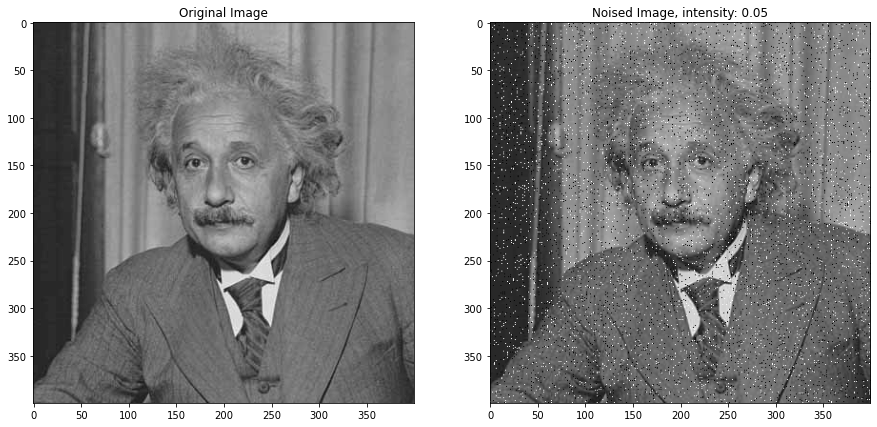

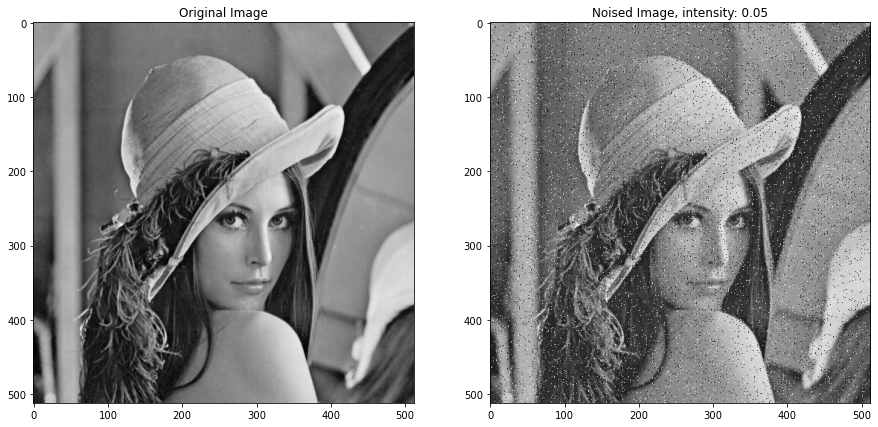

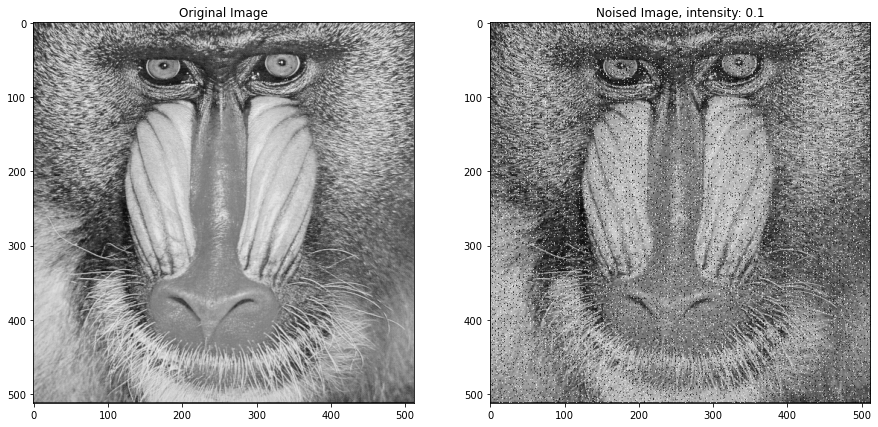

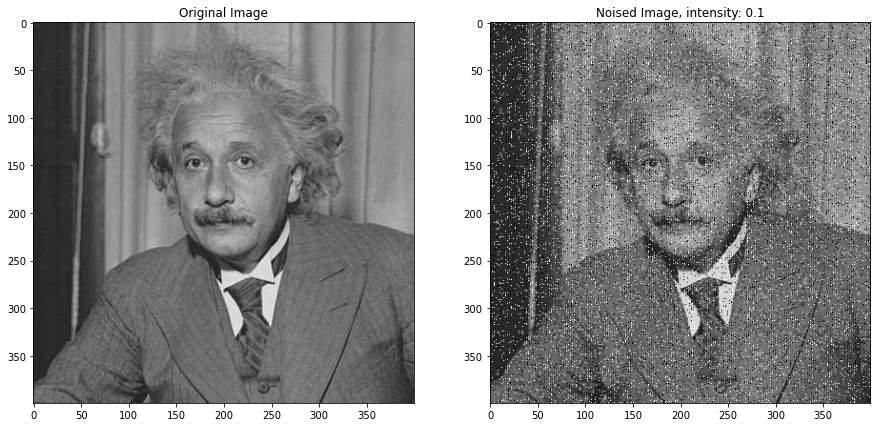

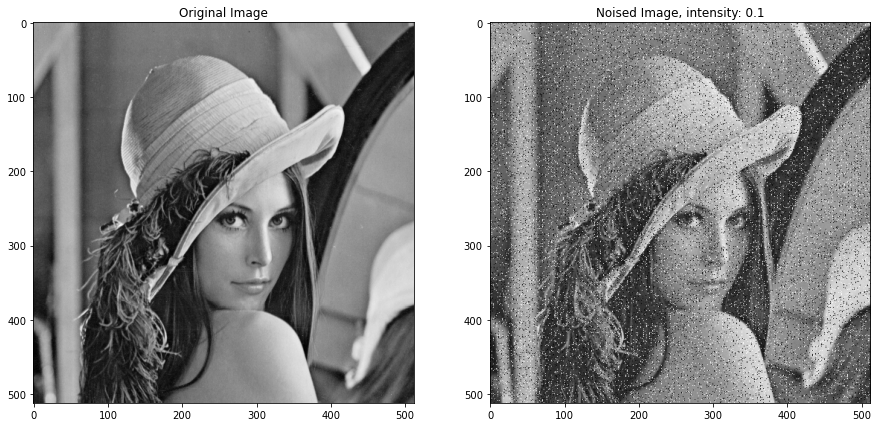

In [8]:
# This code is just to test salt_and_pepper function 

data_path1 = 'sample_images1/*'
img_files1 = glob.glob(data_path1)
imgs1 = []
for file in img_files1:
    img = cv2.imread(file)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    imgs1.append(img)


for img in imgs1:
    fig, (ax1) = plt.subplots(1, 2, figsize=(15, 15))
    ax1[0].set_title('Original Image')
    ax1[0].imshow(img, 'gray')
    ax1[1].set_title('Noised Image, intensity: 0.01')
    ax1[1].imshow(salt_and_pepper(img, 0.01), 'gray')
    plt.show()
        
for img in imgs1:
    fig, (ax1) = plt.subplots(1, 2, figsize=(15, 15))
    ax1[0].set_title('Original Image')
    ax1[0].imshow(img, 'gray')
    ax1[1].set_title('Noised Image, intensity: 0.05')
    ax1[1].imshow(salt_and_pepper(img, 0.05), 'gray')
    plt.show()
    
for img in imgs1:
    fig, (ax1) = plt.subplots(1, 2, figsize=(15, 15))
    ax1[0].set_title('Original Image')
    ax1[0].imshow(img, 'gray')
    ax1[1].set_title('Noised Image, intensity: 0.1')
    ax1[1].imshow(salt_and_pepper(img, 0.1), 'gray')
    plt.show()